In [1]:
import matplotlib.pyplot as plt
%matplotlib inline
from aggregation import Aggregator
from astropy.io import ascii
from astropy.table import Table
import numpy as np

Broken libmagic installation detected. The python-magic module is installed but can't be imported. Please check that both python-magic and the libmagic shared library are installed correctly. Uploading media other than images may not work.


In [2]:
aggregator        = Aggregator('reductions/point_reducer_hdbscan_box_the_jets.csv', 
                               'reductions/shape_reducer_hdbscan_box_the_jets.csv')

In [3]:
multijet_subjects = ascii.read('multiplejets_20220209.txt', format='fast_no_header')

In [4]:
dist_table = Table(names=('subject', 'jet1_start_min', 'jet1_start_max', 'jet1_end_min', 'jet1_end_max', 
                 'jet1_iou_min', 'jet1_iou_max', 'jet2_start_min', 'jet2_start_max', 'jet2_end_min', 'jet2_end_max', 
                 'jet2_iou_min', 'jet2_iou_max'))

for subject in multijet_subjects:
    subject_rows = aggregator.points_data[:][aggregator.points_data['subject_id']==subject[0]]
    nsubjects = len(subject_rows['data.frame0.T1_tool0_points_x'])
    if nsubjects > 0:
        start_dist1, end_dist1, box_iou1 = aggregator.get_cluster_confidence(subject[0], 'T1')
        try:
            start_dist2, end_dist2, box_iou2 = aggregator.get_cluster_confidence(subject[0], 'T5')
        except ValueError:
            start_dist2, end_dist2, box_iou2 = np.asarray([[np.nan],[np.nan],[np.nan]])
        dist_table.add_row([subject[0], start_dist1.min(), start_dist1.max(), end_dist1.min(), end_dist1.max(), 
                  box_iou1.min(), box_iou1.max(), start_dist2.min(), start_dist2.max(), end_dist2.min(), 
                  end_dist2.max(), box_iou2.min(), box_iou2.max()])
    else:
        print(f"{subject[0]} has no classification data!")

62832745 has no classification data!
62833293 has no classification data!
62833614 has no classification data!
62833769 has no classification data!
62835807 has no classification data!
68916604 has no classification data!
70439081 has no classification data!
70443927 has no classification data!


In [5]:
dist_table.pprint()

 subject     jet1_start_min   ...      jet2_iou_min          jet2_iou_max    
---------- ------------------ ... --------------------- ---------------------
70444287.0 17.821773843199157 ...    0.6327088786412599    0.6327088786412599
70444432.0  6.250643768075442 ...   0.23257105491230265   0.23257105491230265
70446217.0  4.792304074976246 ...    0.6488877234145818    0.6488877234145818
70446417.0 27.354810035015483 ...    0.0853789372583905    0.0853789372583905
70439047.0 0.6761175516789135 ...   0.08939613416328675   0.08939613416328675
70439051.0  9.392615799709475 ...                   0.0                   0.0
70439053.0 2.4958539314288077 ...   0.12927934663942384   0.12927934663942384
70439071.0   5.40907110740019 ...                   nan                   nan
70439110.0 3.1986451063079575 ...    0.7259039138393566    0.7259039138393566
70439113.0 3.7093252222227204 ...                   nan                   nan
       ...                ... ...                   ...         

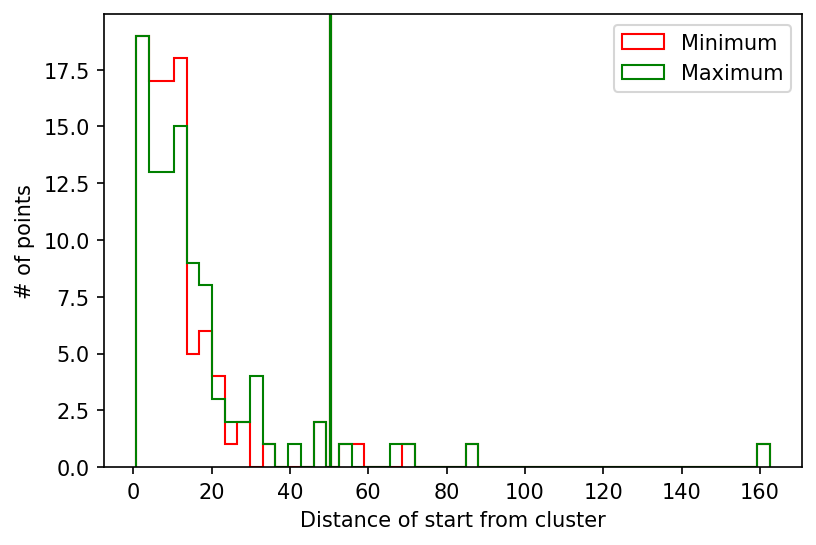

In [6]:
fig, ax = plt.subplots(1,1, dpi=150)
ax.hist(dist_table['jet1_start_min'][:], 50, color='r', histtype=u'step', label=r'Minimum')
ax.hist(dist_table['jet1_start_max'][:], 50, color='g', histtype=u'step', label=r'Maximum')
ax.axvline(np.percentile(dist_table['jet1_start_min'], 95), color='r')
ax.axvline(np.percentile(dist_table['jet1_start_max'], 95), color='g')
ax.legend(loc='upper right')
ax.set_xlabel(r'Distance of start from cluster')
ax.set_ylabel(r'# of points')
plt.show()

5
70439952.0


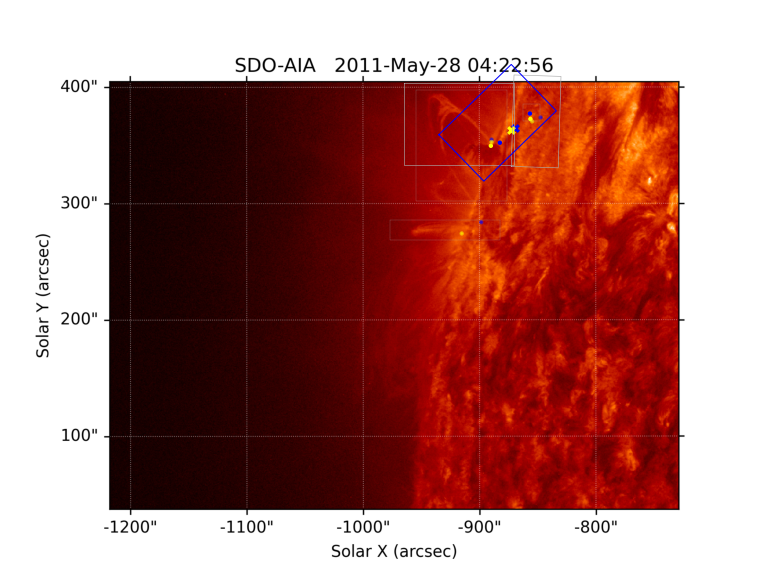

70440470.0


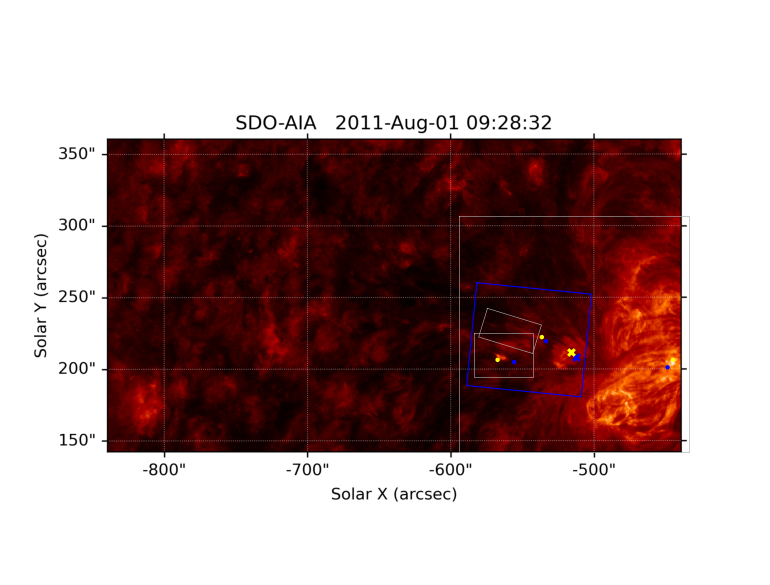

70443276.0


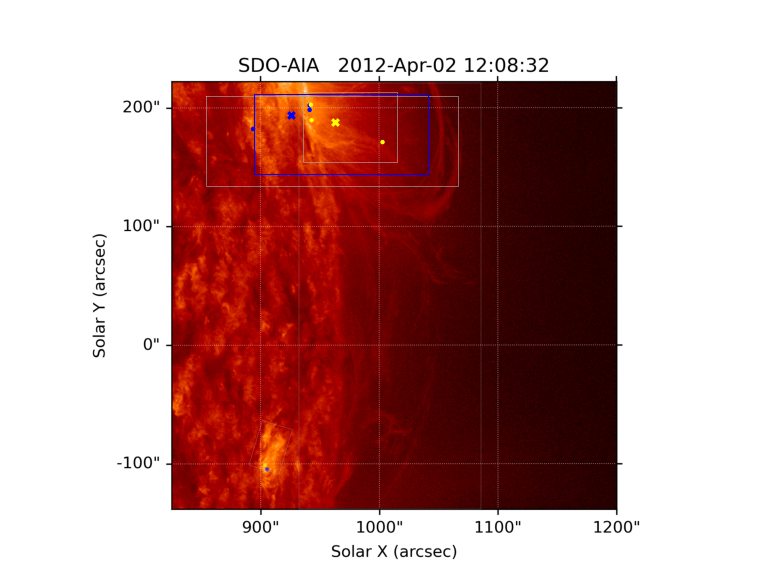

70443614.0


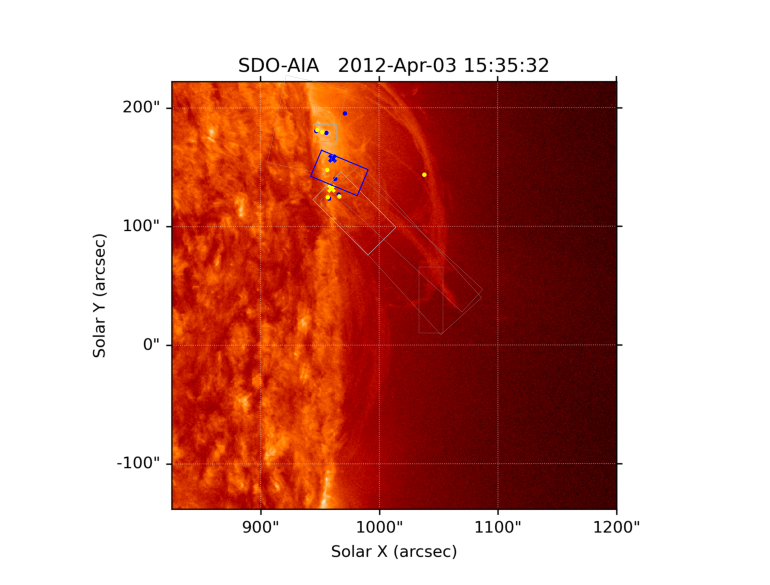

70445912.0


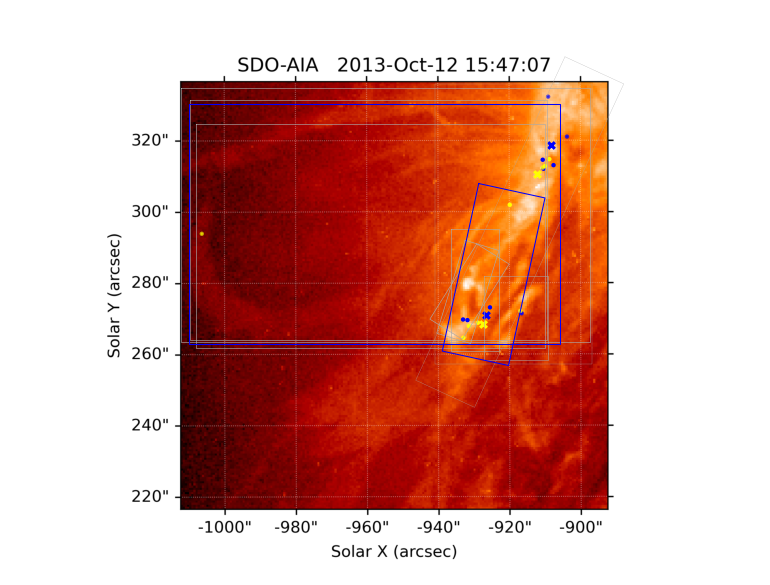

In [7]:
subjects_start_low_conf = dist_table['subject'][dist_table['jet1_start_min'] 
                                                > np.percentile(dist_table['jet1_start_min'], 95)]
print(len(subjects_start_low_conf))
for subject in subjects_start_low_conf:
    print(subject)
    aggregator.plot_subject(subject, 'T1')

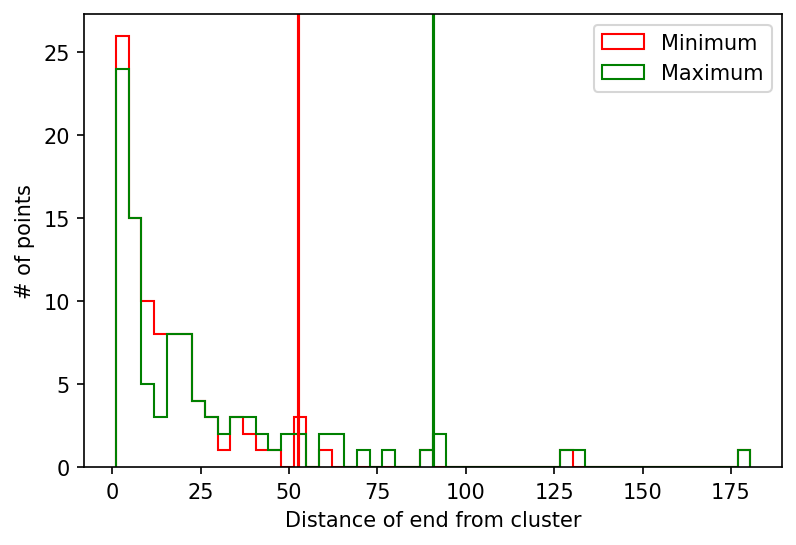

In [22]:
fig, ax = plt.subplots(1,1, dpi=150)
ax.hist(dist_table['jet1_end_min'][:], 50, color='r', histtype=u'step', label=r'Minimum')
ax.hist(dist_table['jet1_end_max'][:], 50, color='g', histtype=u'step', label=r'Maximum')
ax.axvline(np.percentile(dist_table['jet1_end_min'], 95), color='r')
ax.axvline(np.percentile(dist_table['jet1_end_max'], 95), color='g')
ax.legend(loc='upper right')
ax.set_xlabel(r'Distance of end from cluster')
ax.set_ylabel(r'# of points')
plt.show()

5
70439952.0


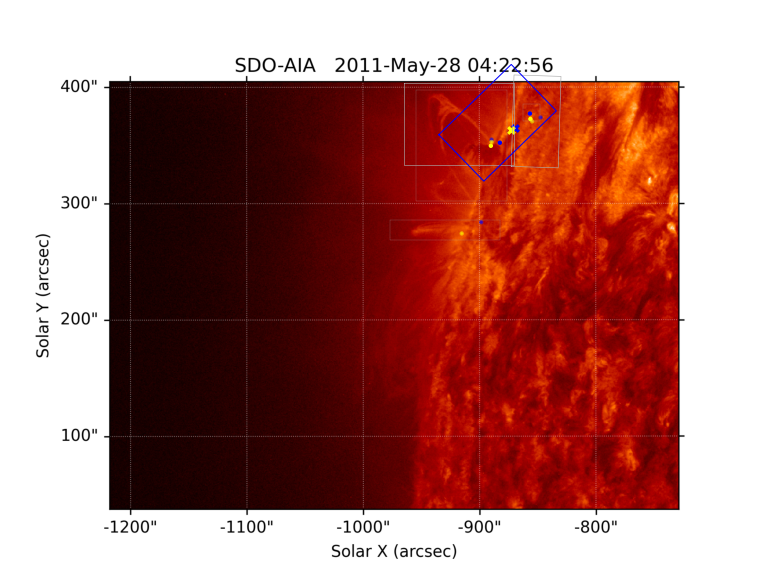

70440470.0


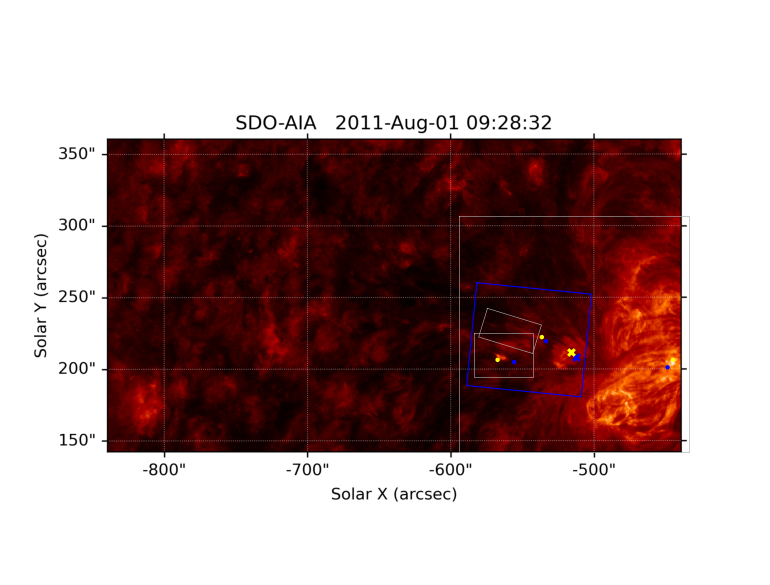

70443276.0


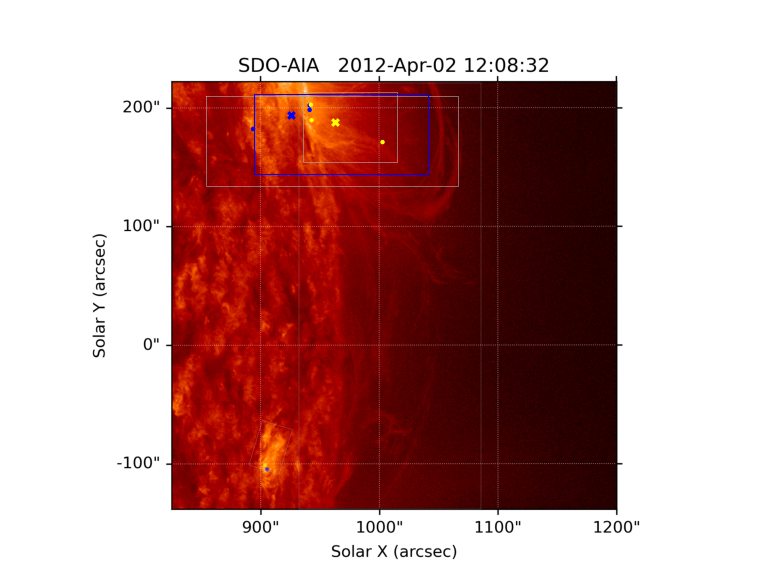

70445912.0


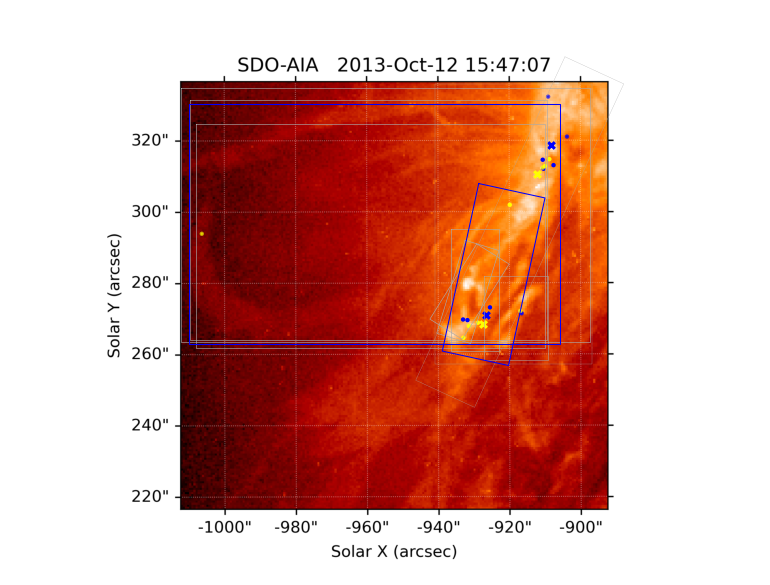

70446641.0


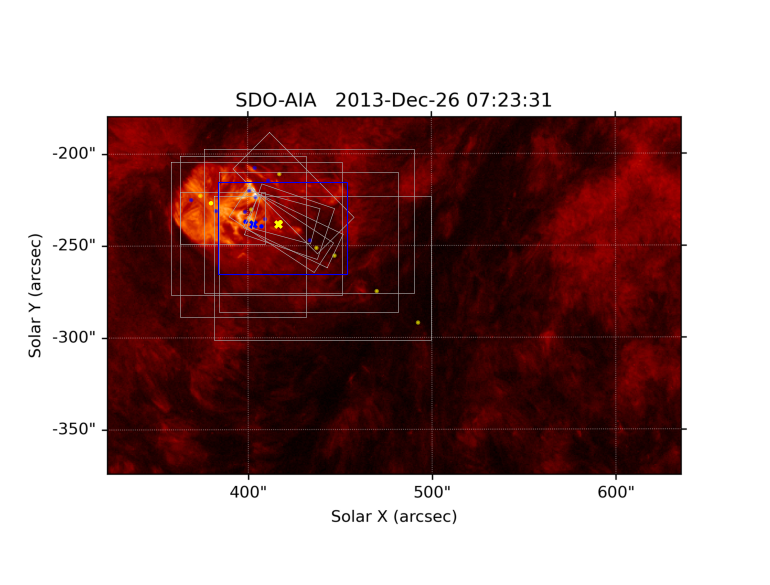

In [9]:
subjects_end_low_conf = dist_table['subject'][dist_table['jet1_end_min'] > np.percentile(dist_table['jet1_end_min'], 95)]
print(len(subjects_end_low_conf))
for subject in subjects_end_low_conf:
    print(subject)
    aggregator.plot_subject(subject, 'T1')

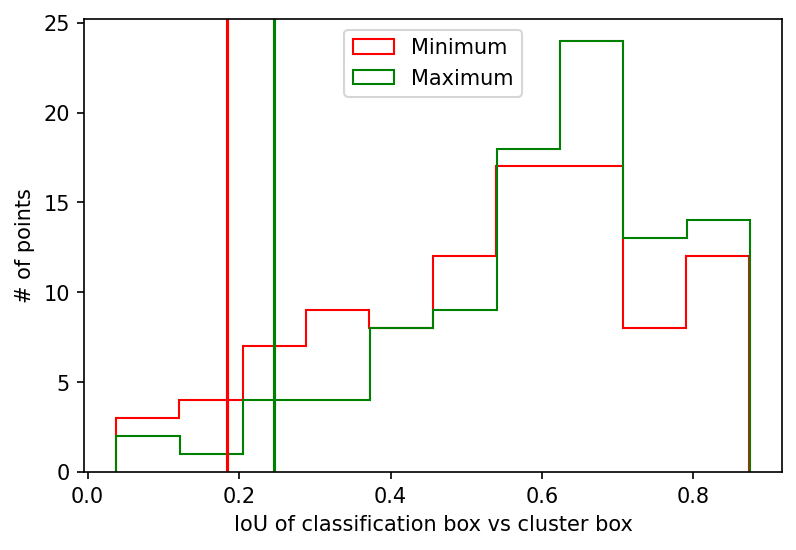

In [20]:
fig, ax = plt.subplots(1,1, dpi=150)
ax.hist(dist_table['jet1_iou_min'][:], 10, color='r', histtype=u'step', label=r'Minimum')
ax.hist(dist_table['jet1_iou_max'][:], 10, color='g', histtype=u'step', label=r'Maximum')
ax.axvline(np.percentile(dist_table['jet1_iou_min'], 5), color='r')
ax.axvline(np.percentile(dist_table['jet1_iou_max'], 5), color='g')
ax.legend(loc='upper center')
ax.set_xlabel(r'IoU of classification box vs cluster box')
ax.set_ylabel(r'# of points')
plt.show()

5
70439158.0


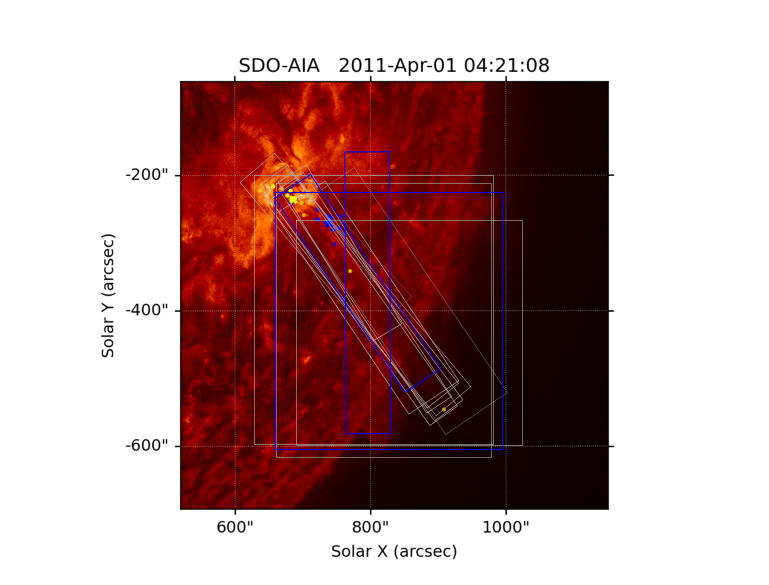

70440043.0


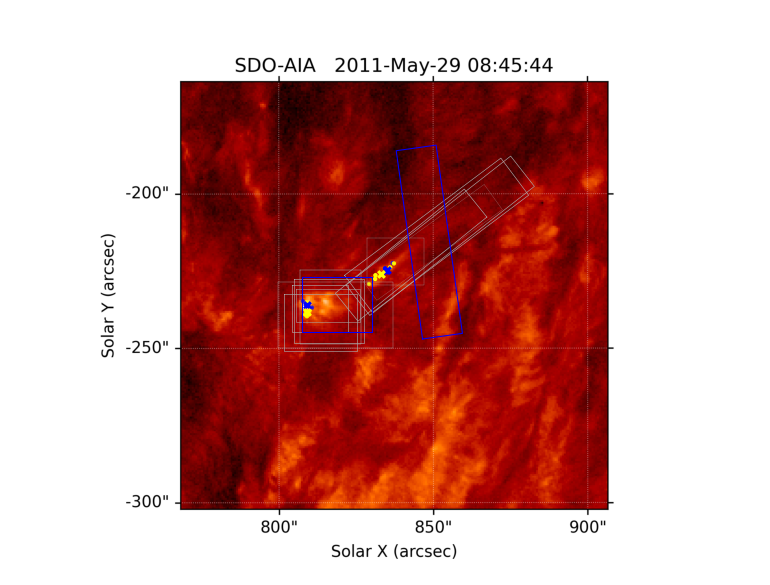

70443614.0


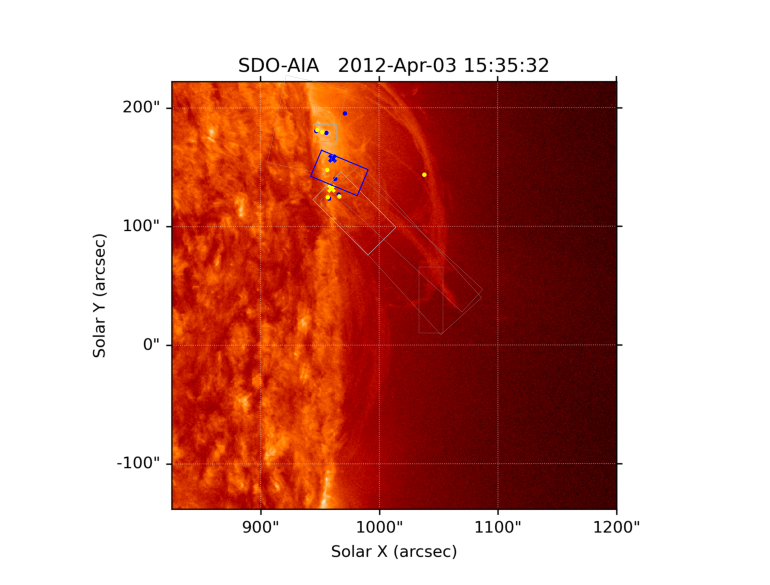

70444340.0


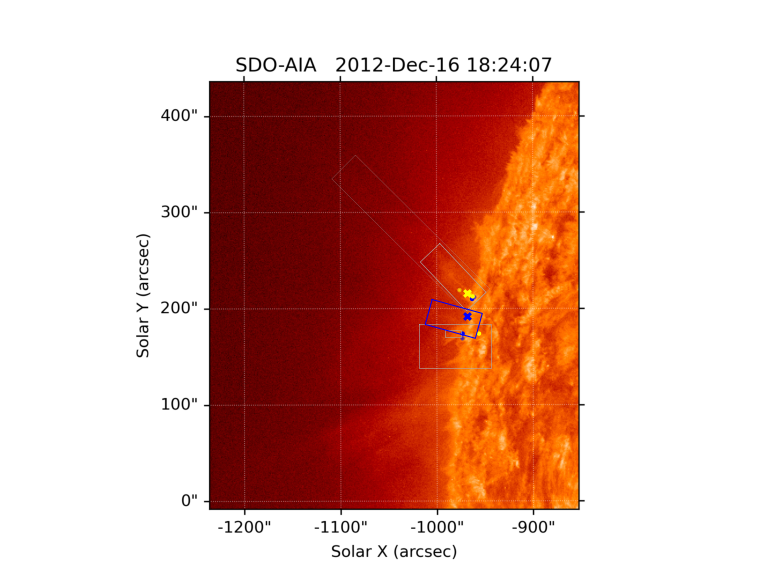

70446508.0


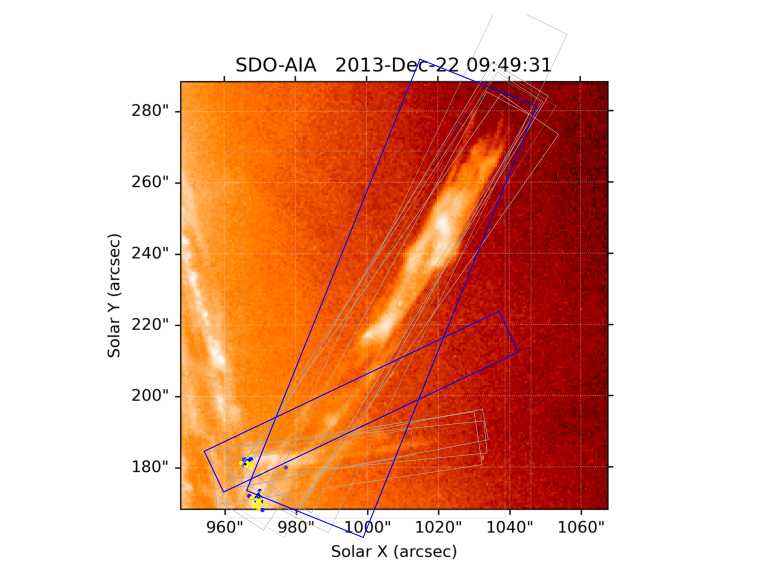

In [11]:
subjects_end_low_conf = dist_table['subject'][dist_table['jet1_iou_min'] < np.percentile(dist_table['jet1_iou_min'], 5)]
print(len(subjects_end_low_conf))
for subject in subjects_end_low_conf:
    print(subject)
    aggregator.plot_subject(subject, 'T1')

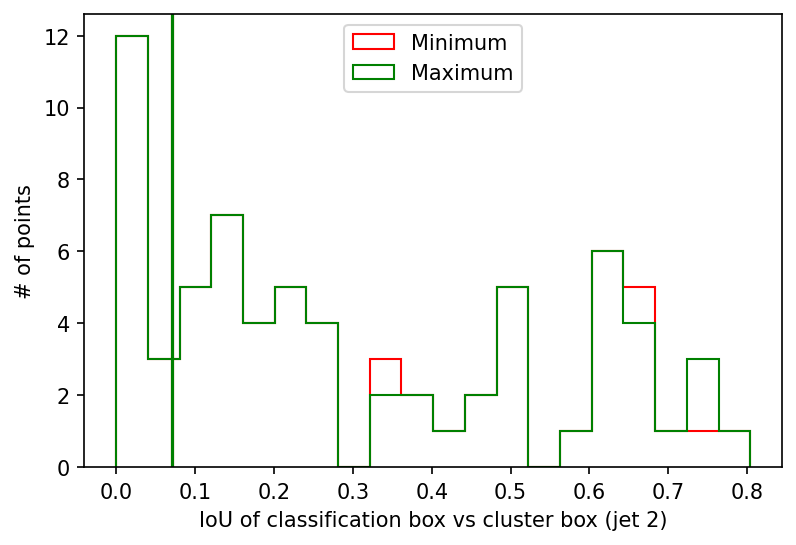

In [26]:
fig, ax = plt.subplots(1,1, dpi=150)
ax.hist(dist_table['jet2_iou_min'][:], 20, color='r', histtype=u'step', label=r'Minimum')
ax.hist(dist_table['jet2_iou_max'][:], 20, color='g', histtype=u'step', label=r'Maximum')
ax.axvline(np.nanpercentile(dist_table['jet2_iou_min'], 20), color='r')
ax.axvline(np.nanpercentile(dist_table['jet2_iou_max'], 20), color='g')
ax.legend(loc='upper center')
ax.set_xlabel(r'IoU of classification box vs cluster box (jet 2)')
ax.set_ylabel(r'# of points')
plt.show()

7
70439051.0


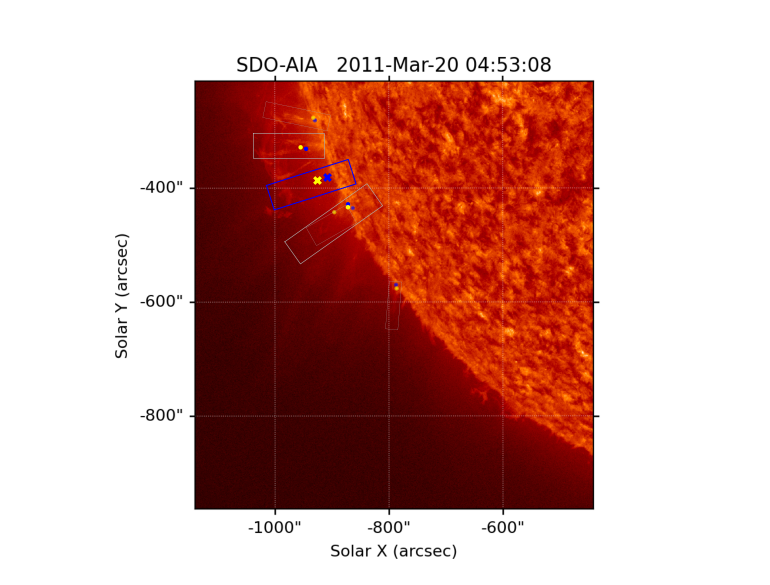

70439952.0


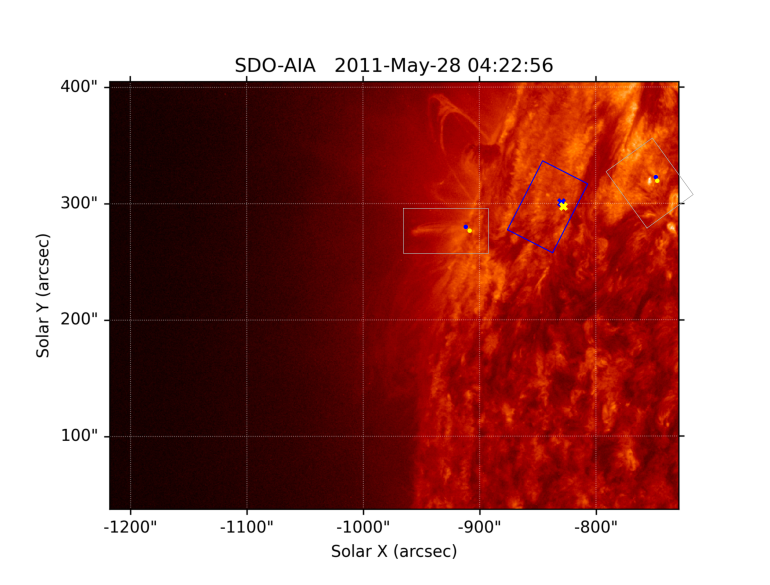

70443924.0


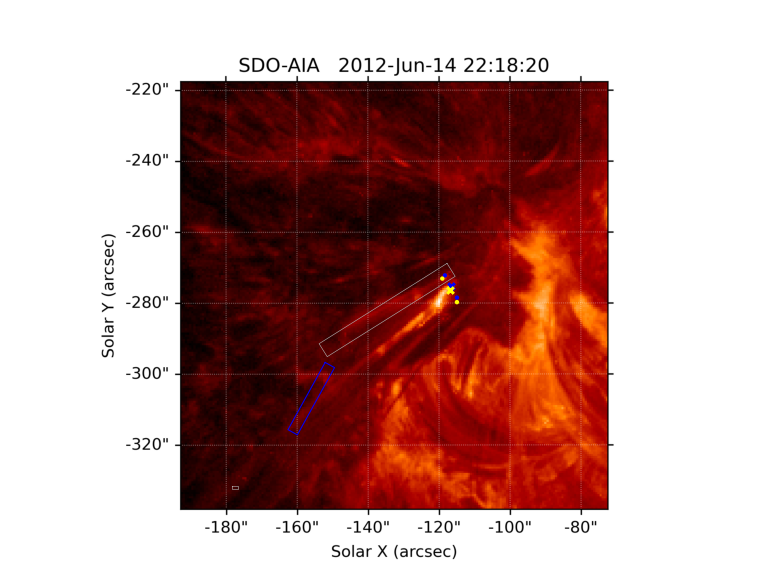

70444186.0


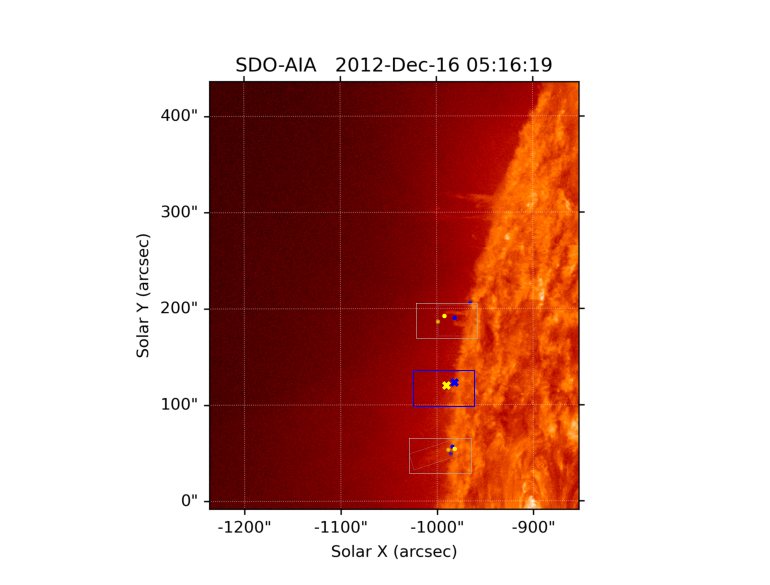

70444645.0


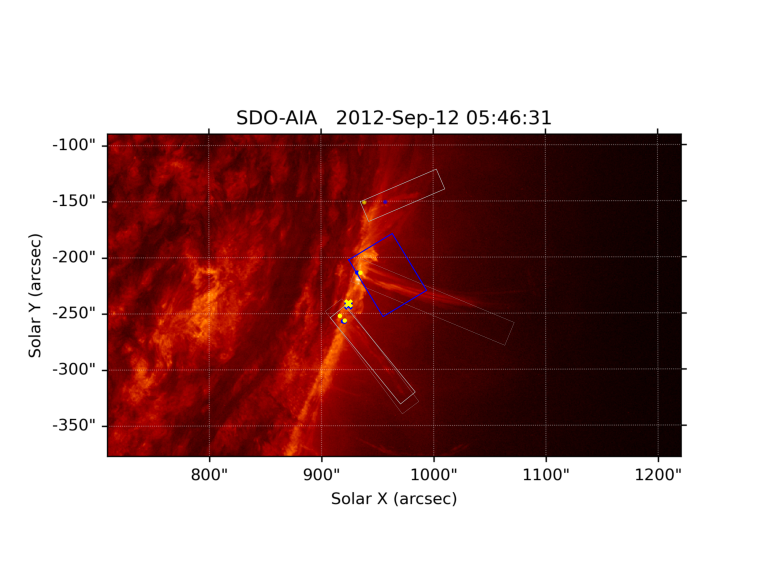

70446064.0


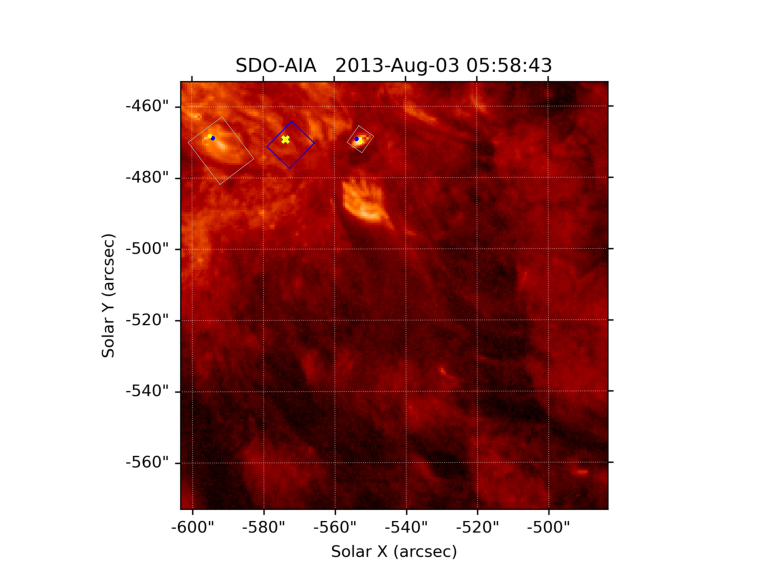

70446415.0


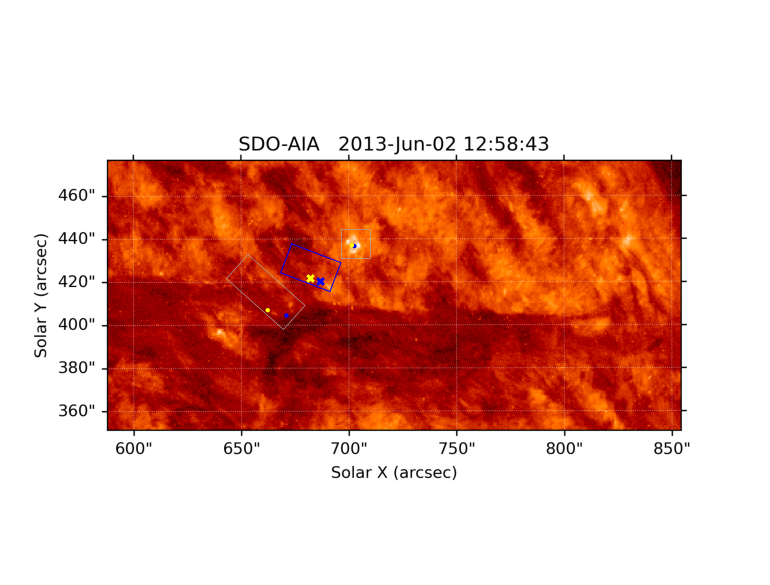

In [16]:
subjects_end_low_conf = dist_table['subject'][dist_table['jet2_iou_min'] < np.nanpercentile(dist_table['jet2_iou_min'], 10)]
print(len(subjects_end_low_conf))
for subject in subjects_end_low_conf:
    print(subject)
    aggregator.plot_subject(subject, 'T5')

7
70439110.0


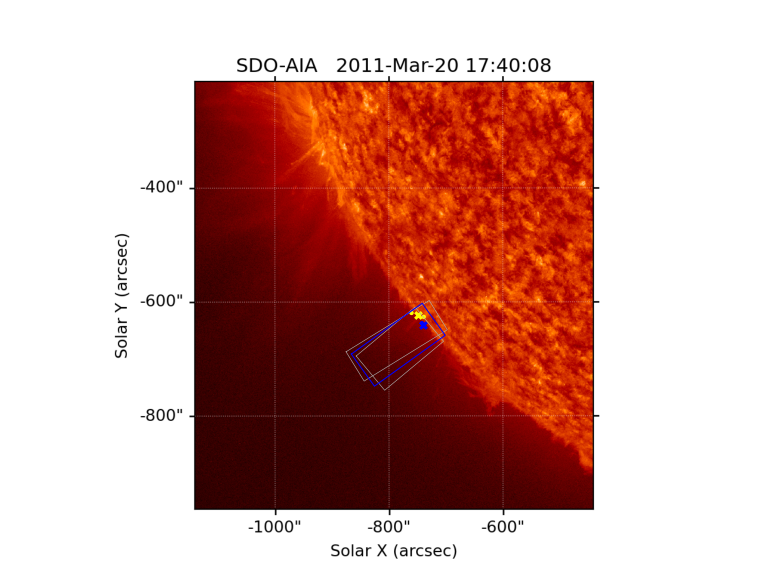

70440009.0


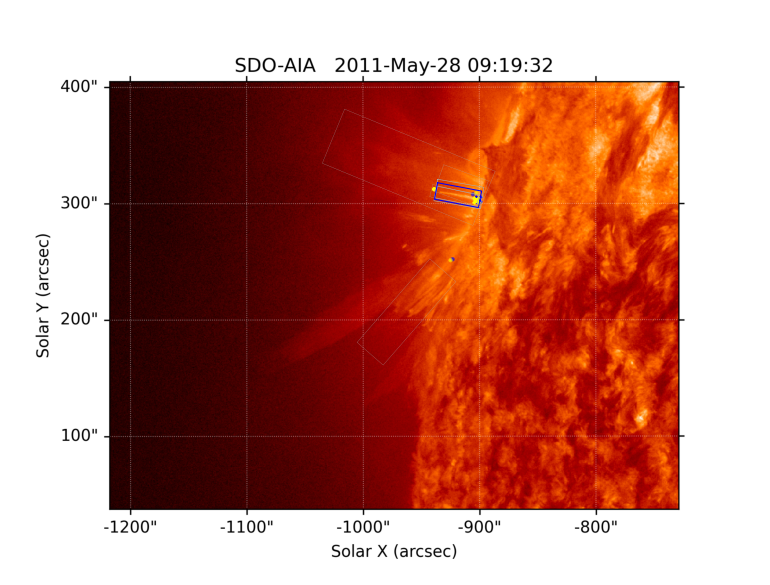

70444533.0


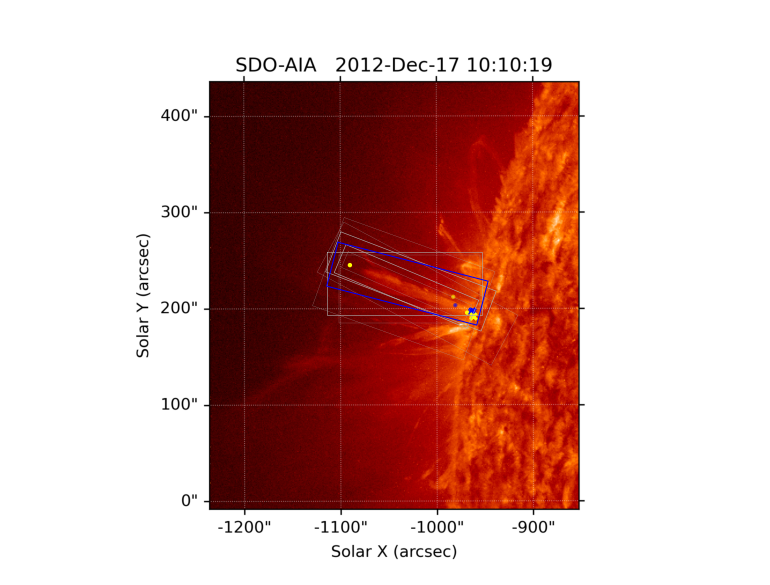

70444535.0


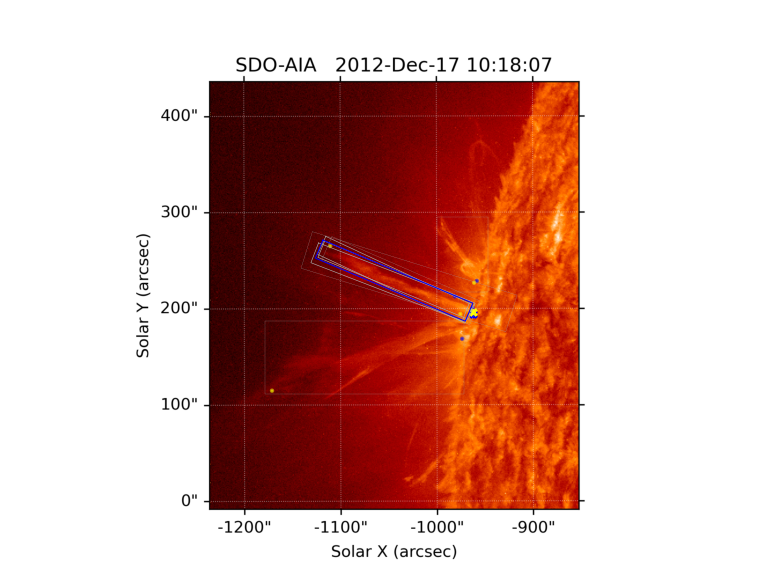

70444538.0


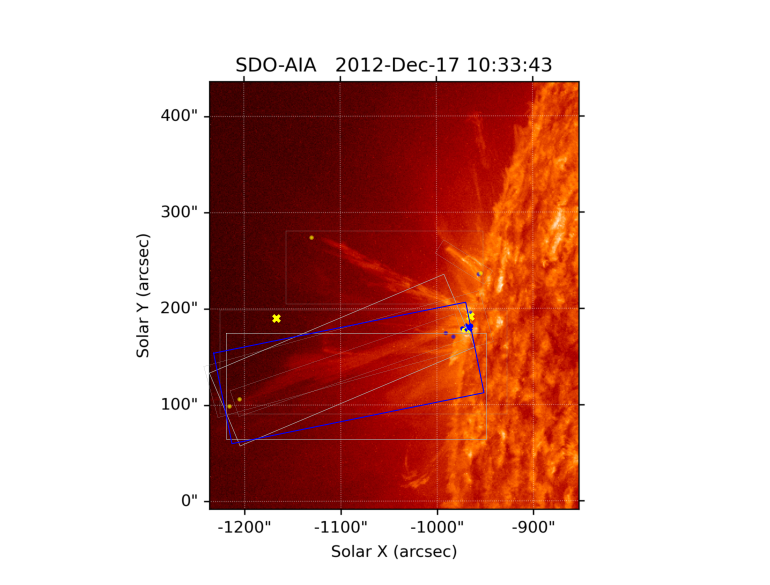

70444555.0


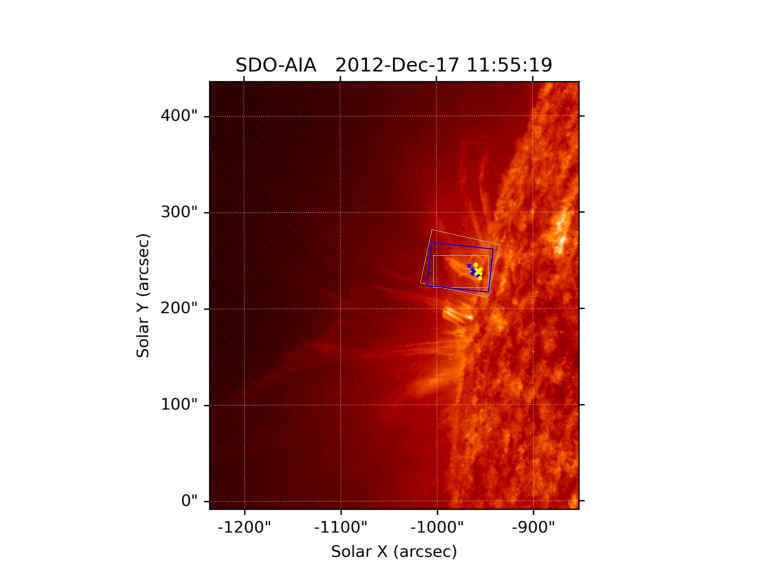

70446508.0


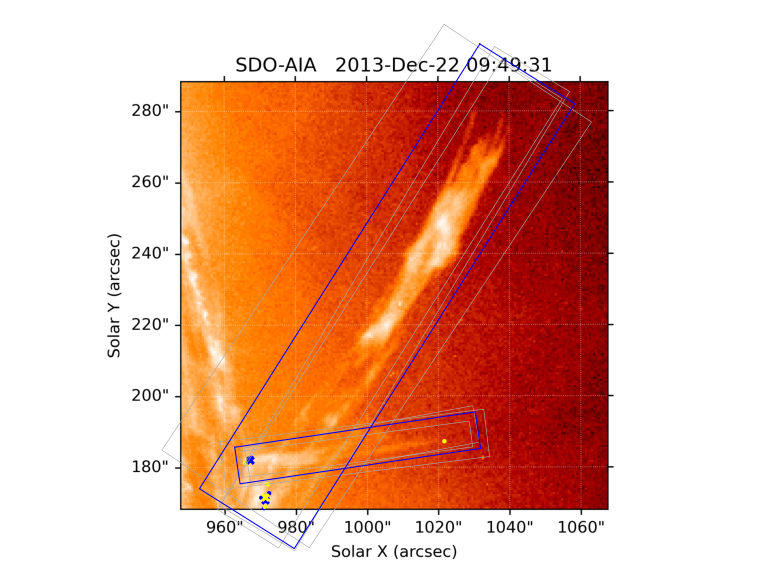

In [15]:
subjects_box_high_conf = dist_table['subject'][dist_table['jet2_iou_min'] > np.nanpercentile(dist_table['jet2_iou_min'], 90)]
print(len(subjects_box_high_conf))
for subject in subjects_box_high_conf:
    print(subject)
    aggregator.plot_subject(subject, 'T5')